In [1]:
import os

import numpy as np

import pandas as pd
from pandas_datareader import data as pdr
from pandas import (
    read_csv as rcsv,
    read_sql_query as rsqq, 
    Timestamp as tstamp,
)
# Import date and timedelta class
from datetime import date
from datetime import timedelta

import sqlalchemy as sql
from sqlalchemy import (
    create_engine as ce,
    inspect
)

import scipy as sci
from scipy import stats
import scipy.optimize as sco

import matplotlib.pyplot as plt

import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns

from pathlib import Path

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')


print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [2]:
# Specifiy date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 7

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2015-10-21 23:20:11.434047 and End date: 2022-10-21 16:04:35.434047


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [3]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.blend_list

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'IBM', 'TSLA', 'TSM', 'NVDA', 'DVN', 'OXY', 'CNI', 'NOC', 'BHF', 'AIG']


### 2. Data Preparation

In [4]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [5]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(1763, 66)

Attributes    Adj Close                                                 \
Symbols     SP500_index         IBM        TSLA        TSM        NVDA   
Date                                                                     
2022-08-16  4305.200195  136.559998  306.563324  89.444130  188.733902   
2017-06-27  2419.379883  115.415588   24.158001  30.511082   36.227470   
2018-08-29  2914.040039  115.916115   20.334000  39.774841   69.060928   
2016-05-10  2084.389893  107.978912   13.912667  18.983547    8.814597   
2019-01-15  2610.300049   96.856339   22.962000  32.483234   37.202480   

Attributes                                                           ...  \
Symbols           DVN        OXY         CNI         NOC        BHF  ...   
Date                                                                 ...   
2022-08-16  62.149887  63.382210  128.470001  483.801422  50.610001  ...   
2017-06-27  24.799677  50.216820   76.653214  234.778305        NaN  ...   
2018-08-29  35.352974  70.639923   85.804321  278.134521  42.060001  ...   
2016-05-10  25.575022  60.924534   55.361465  196.054596        NaN  ...   
2019-01-15  21.830820  58.955269   78.703110  243.523422  34.240002  ...   

Attributes     Volume                                                  \
Symbols           IBM         TSLA         TSM        NVDA        DVN   
Date                                                                    
2022-08-16  4313600.0   88136400.0  10566100.0  45124000.0  9355800.0   
2017-06-27  2496279.0  104946000.0   8081100.0  99949200.0  9619000.0   
2018-08-29  3298875.0  111711000.0  12278200.0  42010800.0  4551100.0   
2016-05-10  4176364.0   61059000.0   5374500.0  26967600.0  7598600.0   
2019-01-15  3668845.0   90849000.0  10165800.0  61701200.0  6301000.0   

Attributes                                                         
Symbols            OXY       CNI        NOC        BHF        AIG  
Date                                                               
2022-08-16  16662200.0  733400.0   500800.0   434100.0  3992000.0  
2017-06-27   2975500.0  642900.0   546200.0        NaN  4986700.0  
2018-08-29   3149800.0  504900.0  1233400.0   580800.0  4297700.0  
2016-05-10   4696300.0  824100.0   904900.0        NaN  6104600.0  
2019-01-15   4499700.0  848400.0   965400.0  1309000.0  5341400.0  

[5 rows x 66 columns]

#### Cleaned Stock Data dataframe - close prices

In [6]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 29 columns from 174 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(1763, 12)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
170,2016-06-27,2000.540039,137.189301,13.236667,24.900000,11.310000,33.750000,73.120003,56.400002,214.149994,NaN,48.790001
925,2019-06-27,2924.919922,132.428299,14.856000,39.590000,40.807499,28.299999,49.750000,91.540001,318.279999,35.029999,53.049999
757,2018-10-24,2656.100098,121.615677,19.233334,36.480000,49.852501,32.130001,68.230003,82.459999,285.859985,39.250000,42.230000
1607,2022-03-11,4204.310059,123.959999,265.116669,101.410004,221.000000,58.639999,57.950001,126.290001,436.299988,46.209999,57.000000
1009,2019-10-25,3022.550049,129.483749,21.875334,51.130001,51.134998,21.469999,42.529999,88.970001,345.000000,38.209999,52.799999


#### Confirm and review raw data storage in csv file

In [7]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(1763, 66)

Attributes    Adj Close                                               \
Symbols           ^GSPC         IBM       TSLA        TSM       NVDA   
Date                                                                   
2018-08-03  2840.350098  114.801537  23.211332  37.575638  62.482471   
2016-01-27  1882.949951   85.386993  12.538000  17.595697   6.926433   
2019-09-16  2997.959961  117.416939  16.187332  41.505489  44.875420   
2016-04-22  2091.580078  105.898560  16.916668  20.347052   8.890582   
2016-09-07  2186.159912  117.386475  13.447333  25.110600  15.311902   

Attributes                                                          ...  \
Symbols           DVN        OXY        CNI         NOC        BHF  ...   
Date                                                                ...   
2018-08-03  35.427036  72.453682  84.853516  277.143524  43.790001  ...   
2016-01-27  19.646336  50.525726  46.707245  159.995804        NaN  ...   
2019-09-16  23.484024  45.012894  89.230873  353.547760  39.820000  ...   
2016-04-22  28.542826  60.477985  60.867134  181.014374        NaN  ...   
2016-09-07  35.902042  62.715607  60.654652  193.557846        NaN  ...   

Attributes     Volume                                                   \
Symbols           IBM         TSLA         TSM        NVDA         DVN   
Date                                                                     
2018-08-03  8424066.0  204847500.0   4575200.0  21428800.0   6560100.0   
2016-01-27  5257614.0   54258000.0   6432800.0  23170000.0  10952700.0   
2019-09-16  2017211.0   70921500.0   3716300.0  23183200.0  13742400.0   
2016-04-22  5430727.0   56794500.0   6447400.0  22354000.0  11294700.0   
2016-09-07  2999196.0   54613500.0  14429800.0  39798800.0   4112800.0   

Attributes                                                           
Symbols            OXY        CNI        NOC        BHF         AIG  
Date                                                                 
2018-08-03   3281600.0   874100.0   703900.0   827800.0  12219100.0  
2016-01-27   6222979.0  2087600.0  1613500.0        NaN  15174500.0  
2019-09-16  24116000.0   708600.0   988600.0  1019200.0   2793600.0  
2016-04-22   2851900.0  1377800.0   853300.0        NaN   6006800.0  
2016-09-07   3881700.0   747000.0   782900.0        NaN   4488200.0  

[5 rows x 66 columns]

#### Clean, confirm, and review sample from csv raw data

In [8]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2015-10-22,2052.510010,137.753342,14.114667,22.510000,7.100000,44.750000,74.213623,61.610001,179.500000,NaN,60.750000
2015-10-23,2075.149902,138.317398,13.939333,22.469999,7.147500,44.959999,73.584694,61.779999,179.830002,NaN,61.279999
2015-10-26,2071.179932,137.342255,14.350667,22.160000,7.115000,42.790001,71.538177,62.119999,180.289993,NaN,61.160000
2015-10-27,2065.889893,131.797318,14.023333,22.200001,7.110000,41.200001,70.080658,59.810001,180.600006,NaN,60.919998
2015-10-28,2090.350098,134.636703,14.197333,22.080000,7.167500,41.560001,73.684525,62.009998,190.500000,NaN,63.889999
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17,3677.949951,121.519997,219.350006,64.889999,118.879997,69.800003,67.360001,111.150002,475.089996,49.840000,51.730000
2022-10-18,3719.979980,122.940002,220.190002,63.709999,119.669998,69.769997,67.779999,113.500000,506.799988,51.419998,52.599998
2022-10-19,3695.159912,122.510002,222.039993,63.660000,120.510002,71.940002,68.459999,112.910004,510.910004,50.570000,52.750000


### Create 'basket' from SQLite temp db

In [9]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(1763, 12)

,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
1283,2020-11-25,3629.649902,118.738052,191.333328,97.489998,132.347504,15.120000,16.719999,110.389999,312.260010,37.610001,40.119999
727,2018-09-12,2888.919922,140.124283,19.369333,43.939999,67.050003,41.950001,75.739998,86.449997,303.529999,40.200001,52.320000
549,2017-12-27,2682.620117,146.395798,20.775999,39.080002,49.292500,41.840000,73.320000,82.290001,306.160004,59.070000,59.540001
1522,2021-11-08,4701.700195,124.540001,387.646667,120.910004,308.040009,44.119999,34.290001,131.880005,363.269989,53.480000,59.160000
949,2019-08-01,2953.560059,143.709366,15.590000,41.869999,41.230000,25.160000,53.169998,93.470001,345.019989,35.770000,54.709999


Indexed dataframe counts and column summary


(1763, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2017-05-18,2365.719971,144.149139,20.870667,34.900002,33.267502,36.900002,60.290001,73.449997,246.880005,NaN,61.389999
2021-03-17,3974.120117,123.355644,233.936661,118.760002,133.412506,23.680000,29.040001,118.059998,310.570007,45.419998,47.669998
2019-05-20,2840.229980,129.177826,13.690667,38.660000,37.937500,30.030001,53.459999,93.209999,314.579987,37.419998,52.430000
2021-08-16,4479.709961,137.275330,228.723328,114.629997,199.500000,27.170000,24.790001,106.629997,368.619995,46.980000,54.610001
2016-04-11,2041.989990,142.686417,16.661333,25.510000,8.970000,29.049999,70.790001,61.900002,199.509995,NaN,53.410000


### 3. Quant Analysis

In [10]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.0275
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.8
Number of days of input dataframe to use as test/experiment data  =  0.19999999999999996


In [11]:
display(sql_basket_indexed_df.shape)

(1763, 11)

In [12]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  1763
Total # of days will use for hisotrical data =  1410
Total # of days will use for testing results =  353


In [13]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [14]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [15]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [16]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(973, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2019-08-05,-0.029778,-0.044075,-0.025689,-0.042737,-0.064520,-0.038754,-0.034388,-0.018919,0.004836,-0.021965,-0.027977
2021-02-04,0.010853,0.015950,-0.005499,0.005098,0.009885,-0.002747,0.012716,-0.002198,0.003691,0.056782,0.061361
2021-01-29,-0.019311,-0.008078,-0.050154,-0.034253,-0.004693,-0.043023,-0.042482,-0.027399,-0.021909,-0.045872,-0.027027
2018-12-28,-0.001242,-0.006592,0.056116,0.009788,0.018907,-0.019214,-0.004773,0.001906,0.011187,-0.015195,-0.018052
2020-09-11,0.000533,0.007465,0.003716,-0.001014,-0.011960,0.011274,0.002944,0.016199,0.026847,-0.001691,0.008523


In [17]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [AIG]   (AIG_count)

In [18]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 800,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

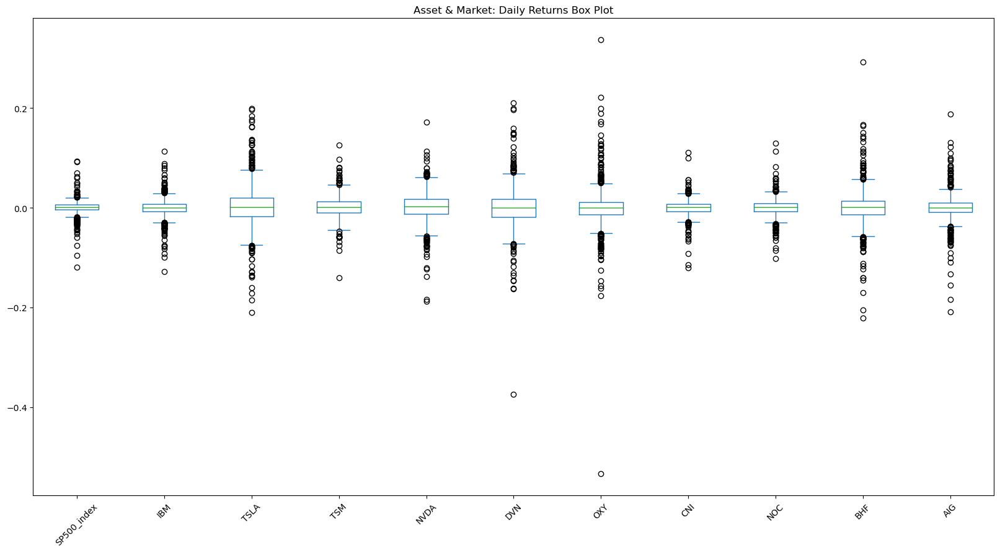

In [19]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [20]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.212042
CNI            0.244932
NOC            0.281476
IBM            0.285434
TSM            0.333585
AIG            0.413054
NVDA           0.475904
BHF            0.551352
DVN            0.607367
OXY            0.633934
TSLA           0.647824
dtype: float64

In [21]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 800,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


OXY            0.004722
IBM            0.087249
AIG            0.087326
BHF            0.103697
DVN            0.242085
CNI            0.424424
NOC            0.449401
SP500_index    0.760928
NVDA           0.963652
TSM            1.075931
TSLA           1.238226
dtype: float64

:Bars   [index]   (0)

In [22]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,
2015-10-22,137.753342,14.114667,22.510000,7.100000,44.750000,74.213623,61.610001,179.500000,NaN,60.750000
2015-10-23,138.317398,13.939333,22.469999,7.147500,44.959999,73.584694,61.779999,179.830002,NaN,61.279999
2015-10-26,137.342255,14.350667,22.160000,7.115000,42.790001,71.538177,62.119999,180.289993,NaN,61.160000
2015-10-27,131.797318,14.023333,22.200001,7.110000,41.200001,70.080658,59.810001,180.600006,NaN,60.919998
2015-10-28,134.636703,14.197333,22.080000,7.167500,41.560001,73.684525,62.009998,190.500000,NaN,63.889999
...,...,...,...,...,...,...,...,...,...,...
2021-05-21,138.374756,193.626663,111.849998,149.917496,25.350000,25.120001,104.290001,370.459991,48.680000,51.310001
2021-05-24,138.355637,202.146667,113.629997,156.119995,25.950001,25.440001,102.629997,372.179993,48.439999,51.880001
2021-05-25,137.466537,201.563339,114.279999,156.477493,25.799999,24.620001,105.389999,369.989990,46.750000,50.799999


In [23]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,0.081472,0.043651,0.042332,0.058027,0.074095,0.078436,0.038498,0.038813,0.094253,0.064887
TSLA,0.043651,0.419675,0.077798,0.130075,0.101970,0.083975,0.045021,0.012565,0.090108,0.068874
TSM,0.042332,0.077798,0.111279,0.097836,0.073695,0.068948,0.038959,0.023136,0.077506,0.048831
NVDA,0.058027,0.130075,0.097836,0.226485,0.094929,0.075133,0.052677,0.040540,0.103391,0.065482
DVN,0.074095,0.101970,0.073695,0.094929,0.368895,0.298389,0.075201,0.039988,0.194043,0.143655


Correlation Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,1.000000,0.236064,0.444587,0.427172,0.427398,0.433479,0.550662,0.483094,0.598908,0.550360
TSLA,0.236064,1.000000,0.360002,0.421908,0.259158,0.204478,0.283737,0.068908,0.252278,0.257392
TSM,0.444587,0.360002,1.000000,0.616274,0.363729,0.326039,0.476823,0.246403,0.421405,0.354388
NVDA,0.427172,0.421908,0.616274,1.000000,0.328420,0.249039,0.451911,0.302637,0.394036,0.333117
DVN,0.427398,0.259158,0.363729,0.328420,1.000000,0.774974,0.505504,0.233903,0.579452,0.572616
OXY,0.433479,0.204478,0.326039,0.249039,0.774974,1.000000,0.468342,0.277072,0.567461,0.562609
CNI,0.550662,0.283737,0.476823,0.451911,0.505504,0.468342,1.000000,0.420856,0.588286,0.544804
NOC,0.483094,0.068908,0.246403,0.302637,0.233903,0.277072,0.420856,1.000000,0.399880,0.379238
BHF,0.598908,0.252278,0.421405,0.394036,0.579452,0.567461,0.588286,0.399880,1.000000,0.784837
AIG,0.550360,0.257392,0.354388,0.333117,0.572616,0.562609,0.544804,0.379238,0.784837,1.000000


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

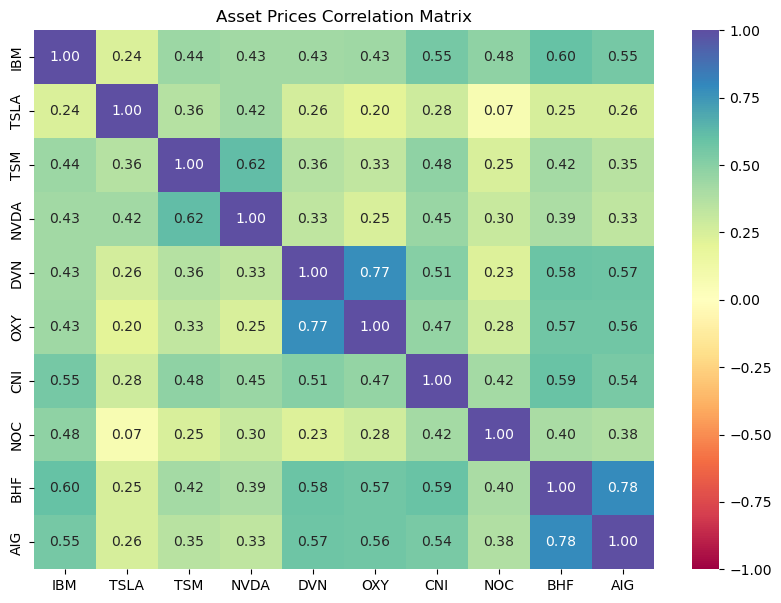

In [24]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot=True, 
    vmin=-1, 
    vmax=1, 
    fmt=".2f", 
    cmap="Spectral"
).set(
    title='Asset Prices Correlation Matrix')

In [25]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


IBM     0.024904
TSLA    0.802152
TSM     0.358915
NVDA    0.458606
DVN     0.147034
OXY     0.002993
CNI     0.103955
NOC     0.126495
BHF     0.057173
AIG     0.036070
dtype: float64

___
### Efficient Frontier Computation

In [26]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 13)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,IBM_W,TSLA_W,TSM_W,NVDA_W,DVN_W,OXY_W,CNI_W,NOC_W,BHF_W,AIG_W
9681,0.179087,5.596863,0.027084,0.069612,0.103198,0.013846,0.061395,0.170707,0.121046,0.089589,0.105350,0.179054,0.086205
4119,0.236029,5.014157,0.041588,0.149893,0.159005,0.181081,0.018789,0.051156,0.077236,0.053809,0.038452,0.150220,0.120361
2880,0.207784,5.070651,0.035554,0.022242,0.052885,0.224297,0.068922,0.173766,0.141744,0.001794,0.167856,0.000920,0.145574
1408,0.207125,4.733890,0.037944,0.177108,0.103724,0.145897,0.050479,0.136563,0.056838,0.012622,0.114358,0.031661,0.170750
2056,0.130626,4.541891,0.022706,0.123879,0.023116,0.114880,0.038692,0.016515,0.134216,0.120994,0.187609,0.105274,0.134823


In [27]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.192364
Volatility     3.875868
SharpeRatio    0.042536
IBM_W          0.212738
TSLA_W         0.040009
TSM_W          0.242529
NVDA_W         0.035063
DVN_W          0.055180
OXY_W          0.002428
CNI_W          0.168710
NOC_W          0.177512
BHF_W          0.064319
AIG_W          0.001511
Name: 6211, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.249729
Volatility     6.563345
SharpeRatio    0.033859
IBM_W          0.024504
TSLA_W         0.209584
TSM_W          0.014815
NVDA_W         0.068716
DVN_W          0.166096
OXY_W          0.208250
CNI_W          0.031514
NOC_W          0.010897
BHF_W          0.231674
AIG_W          0.033951
Name: 3908, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.371208
Volatility     4.747566
SharpeRatio    0.072397
IBM_W          0.001753
TSLA_W         0.205100
TSM_W          0.174044
NVDA_W         0.227935
DVN_W          0.022019
OXY_W          0.006900
CNI_W          0.022458
NOC_W          0.237982
BHF_W          0.013021
AIG_W          0.088787
Name: 3066, dtype: float64

In [28]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter((efficient_frontier_df['Volatility'], efficient_frontier_df['Returns'], efficient_frontier_df.loc[:,'SharpeRatio']), 'Volatility', ['Return', 'Sharpe Ratio'])
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', cmap='plasma', width=800, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [29]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

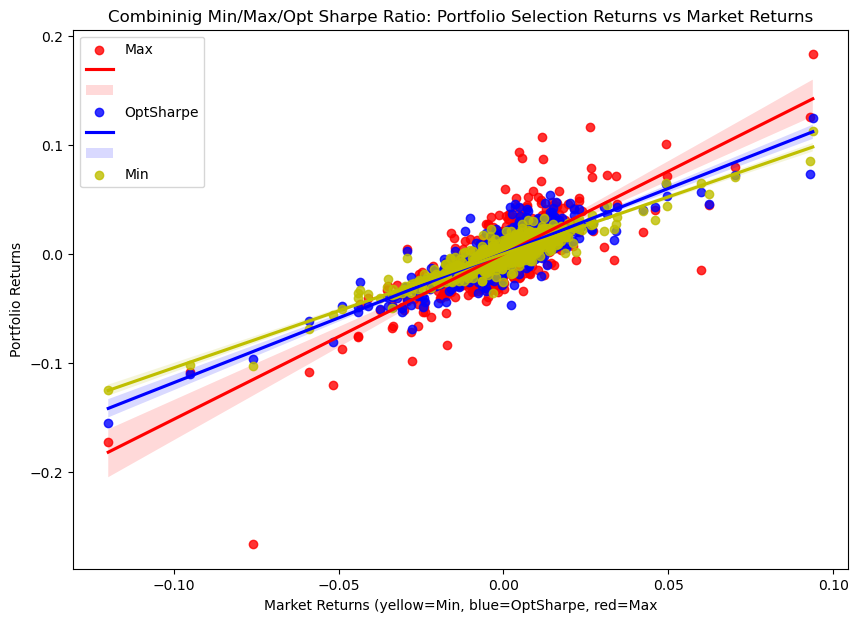

In [30]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

<AxesSubplot:title={'center':'Portfolio Composition - Min Protfolio'}>

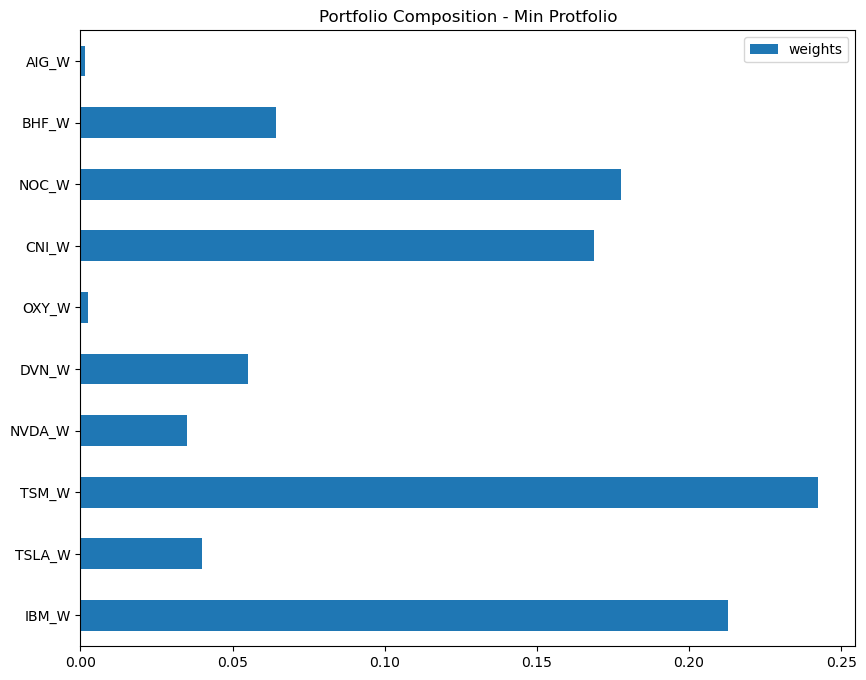

In [63]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot the pie charts of the porfolio allocation/weights
portfolio_min_weights.plot.barh(
    y='weights', 
    title='Portfolio Composition - Min Protfolio',
    figsize=(10,8))

<AxesSubplot:title={'center':'Portfolio Composition - Max Protfolio'}>

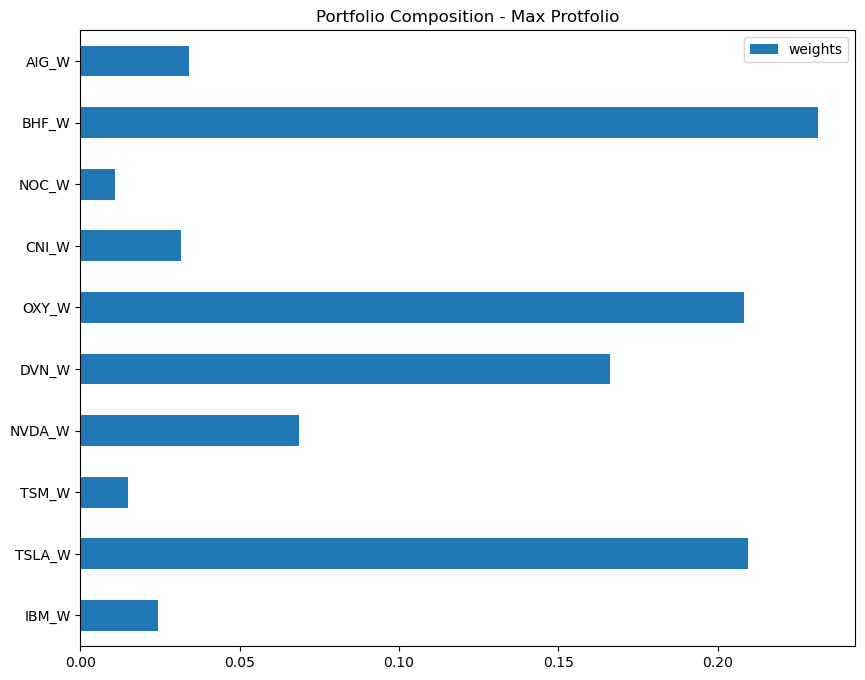

In [64]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot the pie charts of the porfolio allocation/weights
portfolio_max_weights.plot.barh(y='weights', title='Portfolio Composition - Max Protfolio', figsize=(10,8))

<AxesSubplot:title={'center':'Portfolio Composition - Opt Sharpe Ratio Protfolio'}>

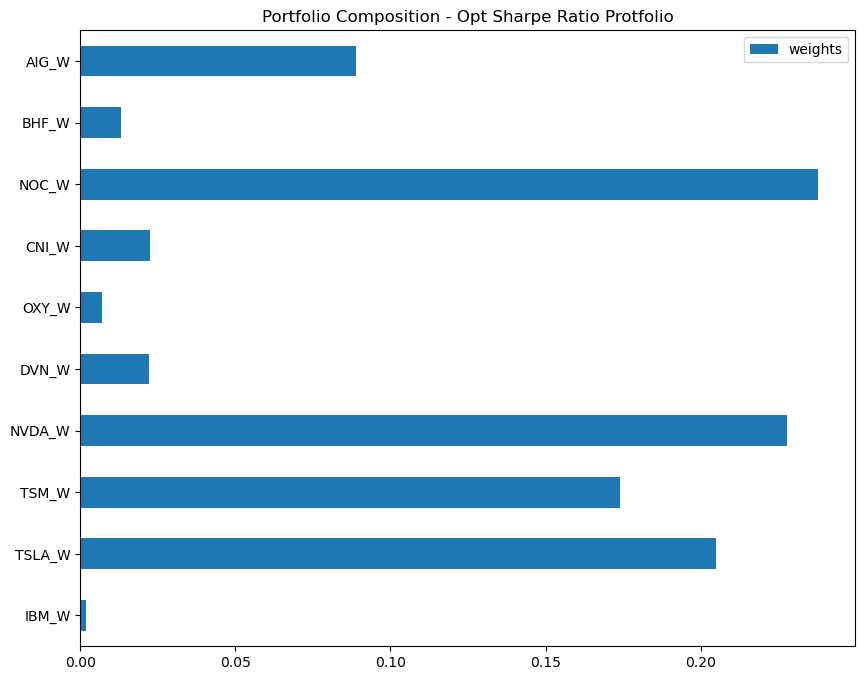

In [65]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot the pie charts of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.plot.barh(y='weights', title='Portfolio Composition - Opt Sharpe Ratio Protfolio', figsize=(10,8))

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [34]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2021-06-01,137.848953,207.96666,118.510002,162.645004,30.200001,28.469999,112.129997,365.619995,49.360001,53.549999


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2022-10-21,129.899994,214.440002,63.75,124.660004,74.290001,71.260002,112.82,522.659973,52.150002,53.25


___
### Monte-Carlo Dataframe Weights List

In [35]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)

In [36]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]

print("Actual realized portfolio value for min/max/opt_sharpe allocations:")
display(investment_pnl_min)
display(investment_pnl_max)
display(investment_pnl_opt_sharpe_ratio)

Actual realized portfolio value for min/max/opt_sharpe allocations:


10293.729820251465

15363.530303955078

10454.39990234375

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [37]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 500


In [38]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [39]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [40]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [41]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.012546,0.998703,1.001842,0.982495,0.997269,0.991249,0.997681,0.993489,1.002193,1.002307,...,0.998889,1.001752,0.998733,1.007217,1.005832,1.006017,1.004099,1.003250,1.002221,0.994419
2,1.011312,0.994398,1.003462,0.967049,0.971981,0.990436,0.988457,0.982827,1.004017,1.009942,...,1.004263,0.999144,0.997433,1.016025,1.007403,1.005233,1.011490,1.004609,0.993741,0.980120
3,1.012157,0.991653,0.994806,0.980065,0.968967,0.982047,0.984388,0.982112,0.999795,1.005174,...,1.003734,0.999150,0.998333,1.012728,1.014048,1.001076,1.018253,1.011089,0.995806,0.984254
4,1.006666,0.984557,0.988383,0.981391,0.957577,0.978874,0.998946,0.981375,0.988439,1.017110,...,0.993417,0.987699,0.999230,1.012591,1.020609,1.005521,1.027303,1.009868,0.979202,0.990204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,0.732161,0.767198,1.084855,1.104441,1.013257,0.785282,1.104332,1.150374,1.279318,1.009861,...,0.813350,0.926492,0.960036,0.776964,0.968138,1.150492,1.164904,0.916828,0.946074,0.970683
350,0.725855,0.771216,1.088539,1.103354,1.004928,0.779874,1.103101,1.148450,1.287067,1.010531,...,0.809685,0.918350,0.961195,0.785732,0.973288,1.147586,1.163042,0.925922,0.947814,0.981884
351,0.734472,0.777654,1.097485,1.101463,1.002030,0.785146,1.103985,1.139009,1.284848,1.003960,...,0.801620,0.919932,0.963477,0.783070,0.973333,1.150525,1.166935,0.925371,0.940803,0.981885
352,0.734670,0.782613,1.110402,1.104624,1.012320,0.782846,1.083079,1.128815,1.284158,1.006149,...,0.802626,0.921057,0.964320,0.782757,0.967871,1.149521,1.150815,0.919191,0.939950,0.988857


In [42]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [43]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.001356,1.005051,0.990392,1.006510,0.984622,0.996964,1.015439,0.983924,1.011143,1.010122,...,0.997135,1.002254,0.998967,1.000856,1.003505,0.991745,1.031715,1.029446,1.002195,1.009043
2,1.002739,0.989457,0.974073,1.000410,0.989344,0.996700,1.015694,0.996955,1.002717,1.011587,...,0.996878,1.015682,0.999654,1.014314,1.003855,1.002414,1.032778,1.039595,0.999029,0.997101
3,1.004307,0.989497,0.980641,1.005089,1.011174,1.003994,1.015593,1.000137,0.998577,1.007845,...,1.017966,0.997218,0.990024,0.996594,1.007946,1.007558,1.033413,1.042823,0.991858,0.984115
4,1.010227,1.003650,0.984520,1.012052,1.011494,0.995858,0.991423,1.017830,0.988359,0.986617,...,1.021562,1.000114,0.963626,1.003037,0.993833,1.022177,1.010955,1.055916,0.966863,0.975835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,2.382053,2.170284,1.545880,1.501947,1.686302,1.315944,2.424248,1.939903,1.479125,1.260157,...,1.569020,1.935613,1.362589,1.688904,1.411441,1.847702,0.923247,1.606514,1.139615,2.221007
350,2.271800,2.191951,1.547269,1.515100,1.680219,1.297182,2.398089,1.957816,1.480712,1.280515,...,1.576361,1.926540,1.383504,1.676127,1.407020,1.853272,0.960538,1.573256,1.134959,2.256971
351,2.311811,2.240201,1.526853,1.527927,1.701445,1.297020,2.416463,1.944501,1.455979,1.288132,...,1.597706,1.992996,1.384964,1.673511,1.449554,1.853377,0.945523,1.582543,1.152728,2.209268
352,2.306536,2.226253,1.530299,1.531545,1.706404,1.292413,2.389865,1.971406,1.436518,1.281675,...,1.622201,1.967019,1.394950,1.659444,1.430719,1.890576,0.935470,1.590290,1.151077,2.206479


In [44]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [45]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.990084,1.024503,1.014472,1.025222,1.007004,0.969998,1.009165,0.992280,1.014912,1.011386,...,1.010793,0.992957,0.973219,1.013742,0.970148,0.998388,0.996177,0.974960,0.980250,1.000343
2,0.983368,1.032105,1.019311,1.021553,1.014080,0.987752,0.990665,0.988353,1.013415,1.021954,...,1.001664,1.003224,0.972919,0.998457,0.971293,0.996013,1.004152,0.963315,1.023142,0.995090
3,0.996993,1.026730,0.995648,1.021752,1.017877,0.979038,1.000884,1.014099,1.039407,1.006001,...,1.014879,1.010742,0.979549,1.000182,0.968825,1.003185,0.992477,0.957404,1.040329,0.977934
4,0.993582,1.023581,0.975942,1.011011,1.001950,0.977530,1.008053,1.011710,1.013452,1.002732,...,1.010705,0.998745,0.993465,1.013327,0.951768,1.002683,0.991713,0.955565,1.029593,0.972560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,1.315945,1.028000,0.924641,1.357209,0.937122,0.820012,1.241999,1.303819,1.179566,1.311033,...,0.979825,1.022310,1.060063,0.792509,1.108083,1.226600,1.027166,0.690485,1.079653,0.903586
350,1.302096,1.036901,0.910166,1.359881,0.917962,0.823838,1.261631,1.306898,1.172653,1.281982,...,0.966523,1.027816,1.071555,0.785531,1.123471,1.254308,1.041437,0.700924,1.085058,0.905169
351,1.333640,1.072815,0.904983,1.387730,0.929819,0.828927,1.258627,1.305379,1.184580,1.295213,...,0.959235,1.035957,1.090700,0.764604,1.157240,1.265135,1.044975,0.689118,1.054560,0.905659
352,1.357639,1.054518,0.875895,1.384962,0.946499,0.857734,1.248504,1.308029,1.197584,1.286012,...,0.959219,1.028948,1.100496,0.764315,1.152894,1.275672,1.042434,0.685156,1.055289,0.907820


### 4. Visualizations

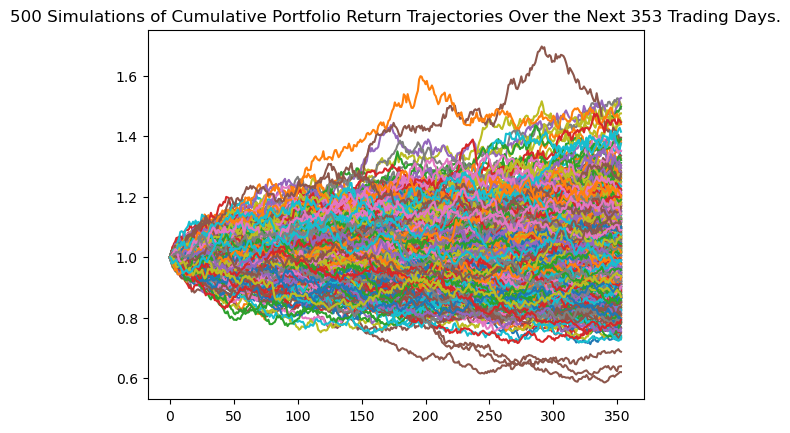

In [46]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

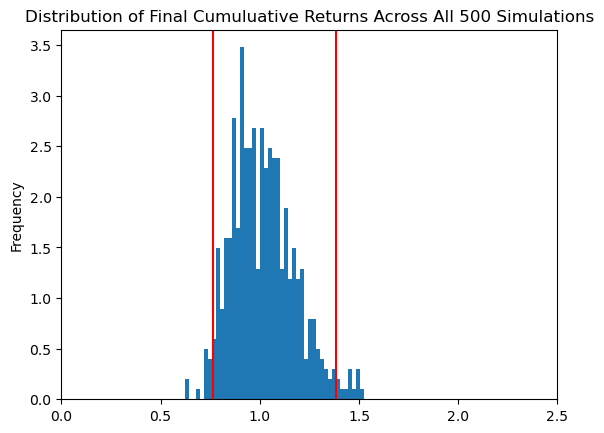

In [47]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

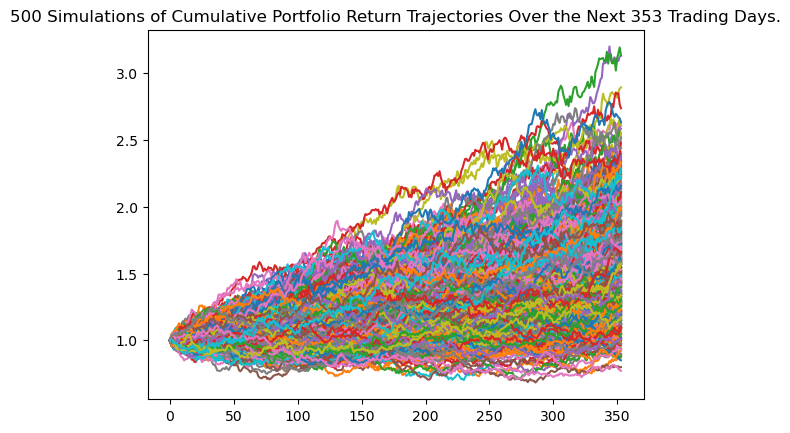

In [48]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

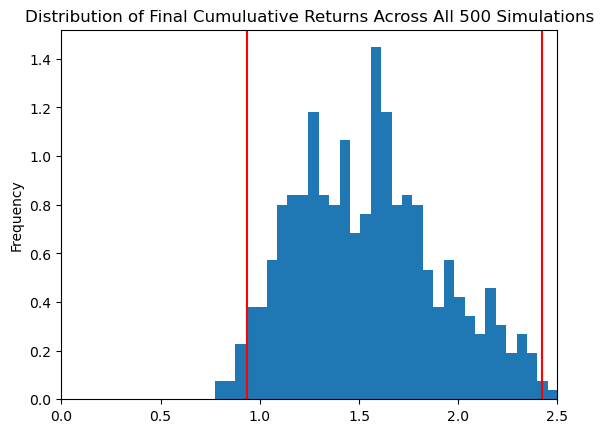

In [49]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

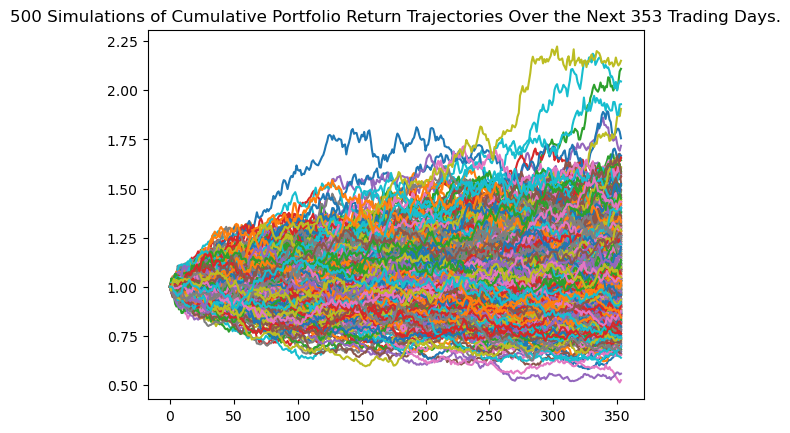

In [50]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

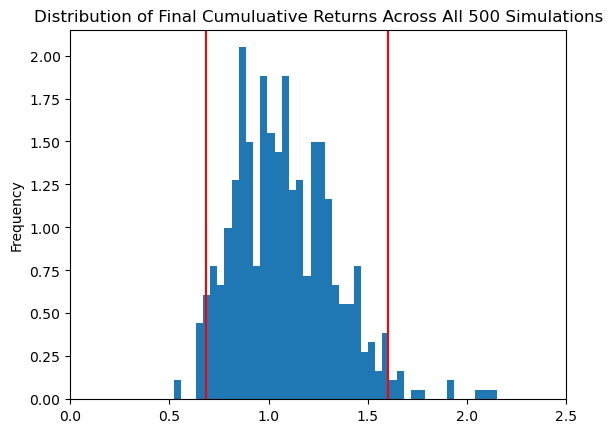

In [51]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

In [52]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           500.000000
mean              1.019184
std               0.158230
min               0.620492
25%               0.905881
50%               1.007922
75%               1.118735
max               1.526589
95% CI Lower      0.763788
95% CI Upper      1.381567
Name: 353, dtype: float64


In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           500.000000
mean              1.575244
std               0.398881
min               0.771740
25%               1.275595
50%               1.557666
75%               1.799060
max               3.134504
95% CI Lower      0.936912
95% CI Upper      2.423944
Name: 353, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           500.000000
mean              1.082892
std               0.252764
min               0.524343
25%               0.884881
50%               1.060116
75%               1.248604
max               2.150292
95% CI Lower      0.684039
95% CI Upper      1.603669
Name: 353, dtype: float64


In [55]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [56]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $7637.88 and $13815.67.
The actual realized value of the portfolio was $10293.73


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $9369.12 and $24239.44.
The actual realized value of the portfolio was $15363.53


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $6840.39 and $16036.69.
The actual realized value of the portfolio was $10454.40
